# Plant expert at your finger
## Première exploration
### Inventaire des jeux de données
Afin de réaliser un inventaire des informations disponibles, nous avons téléchargé les jeux de données et parcourus les fichiers.  
Les jeux de données __cocodataset__ et __googleapis__ ont été ignorés car ils contiennent énormément d'images ne concernant pas les plantes.  
  
__/!\ Conditions d'utilisation de ce notebook :__  
* Télécharger les 5 jeux de données compressés suivants :  
  * plantclef-2019-amazon-rainforest-plants-images
  * v2-plant-seedlings-dataset
  * new-plant-diseases-dataset
  * plant-disease
  * plantvillage-dataset
* Décompresser chaque jeu de données dans un répertoire portant son nom
* Déposer les 5 répertoires dans le même répertoire commun et affecter ce répertoire racine à la variable dir_data du fichier ressources.py

In [1]:
# Initialisation des constantes
import os
import sys
sys.path.append(os.path.abspath(os.path.join(os.getcwd(), os.pardir)))
from lib import ressources
racine = os.path.abspath(os.path.realpath(ressources.dir_data))
sep = ressources.csv_separator
ossep = os.sep

Nous récupérons la liste des fichiers disponibles dans le répertoire de dépôt des jeux de données (répertoire 'racine').  
Les chemins d'accès aux fichiers sont stockés dans le fichier filelist.txt en vue d'une réutilisation ultérieure

In [7]:
# Récupération de la liste des fichiers de données
from lib.tools import listdirectory
filelist = listdirectory(racine)
fichier = open(racine + ossep + 'filelist.txt', "w")
try:
    fichier.write('\n'.join(filelist))
finally:
    fichier.close()  

Nous récupérons la liste des fichiers précédemment stockée dans le fichier filelist.txt  
Cette étape n'a d'intérêt que lorsque l'on souhaite exécuter ce notebook en plusieurs étapes sans avoir à rescanner le répertoire 'racine'.

In [22]:
fichier = open(racine + ossep + 'filelist.txt', "r")
filelist = fichier.readlines()
filelist = [x.strip('\n') for x in filelist]

### Collecte de méta-données
Afin de récupérer quelques informations sur les fichiers, nous optons pour un traitement en multiprocessing (sur les conseils de Thomas).  
L'objectif est de paralléliser la collecte sur plusieurs fichiers en même temps pour réduire la durée de traitement.  
D'abord, interressons nous au nombre de coeurs disponibles sur la machine.  
Nous garderons un coeur libre pour pouvoir travailler sur d'autres sujets en parallèle.  
Nous utiliserons donc (Nombre de CPU disponibles - 1) pour le multiprocessing.

In [10]:
cpuCount = os.cpu_count()
print('Nombre de CPU disponibles :', cpuCount)
nprocs = cpuCount - 1
print('Nombre de CPU utilisés pour le multiprocessing :', nprocs)

Nombre de CPU disponibles : 8
Nombre de CPU utilisés pour le multiprocessing : 7


Nous instancions un pool de process et appellons la méthode get_info sur chaque fichier de l'inventaire.  
Les résultats de la collecte sont sauvegardés dans le fichier filelist.csv  
Nous avons été confronté à un problème d'exécution avec Jupyter sous Windows. L'astuce (non détaillée ici) consiste à déplacer la méthode get_info dans un module à part et à instancier le pool sous la condition `__name__ ==  '__main__'`


In [23]:
import multiprocessing as mp
from lib.tools import get_info # Astuce pour Jupyter + Windows
from itertools import repeat

if __name__ ==  '__main__': # Astuce pour Jupyter + Windows
    # Collecter les métadonnées
    pool = mp.Pool(nprocs)
    results = pool.starmap(get_info, zip(filelist, repeat(sep), repeat(racine)), 4)
    pool.close()
    pool.join()
    # Stocker les métadonnées dans un fichier exploitable ultérieurement
    fichier = open(racine + ossep + 'filelist.csv', "w")
    try:
        head = 'dataset' + sep + 'folder' + sep + 'file' + sep + 'ext' + sep + 'size' + sep + 'height' + sep + 'width' + sep + 'channel' + sep + 'color'
        fichier.write(head + '\n')
        fichier.write('\n'.join(results))
    finally:
        fichier.close()    

### Valorisation des métadonnées
Les informations collectées à l'étape précédente nécessitent quelques aménagements (enrichissement, harmonisation, ...).  
Le fichier filelist.csv est retraité à l'aide du module pandas pour en simplifier la manipulation.

In [24]:
import pandas as pd
df = pd.read_csv(racine + ossep + 'filelist.csv', sep=sep, encoding='ansi')
# Mettre l'extension du nom du fichier en majuscule
df['ext'] = df['ext'].apply(lambda x: x.upper())
# Harmonier les noms d'extension
df = df.replace({'ext': {'JPEG': 'JPG'}})
# Calculer le nombre de fichiers par type d'extension et par groupe
df.groupby(['dataset', 'ext']).agg({'file':'count'})

file
dataset                                        ext        
new-plant-diseases-dataset                     JPG   87900
plant-disease                                  JPG  108608
                                               PNG       2
plantclef-2019-amazon-rainforest-plants-images CSV       1
                                               JPG    3142
                                               XML    3133
plantvillage-dataset                           JPG  162914
                                               PNG       2
v2-plant-seedlings-dataset                     PNG   11078

Nous constatons que le jeu de données __plantclef-2019-amazon-rainforest-plants-images__ contient d'autres fichiers que des images.Nous disposons d'un fichier CSV et d'un ensemble de fichiers XML :  
 * Le fichier CSV synthétise la classification d’un peu plus de 448 000 photos mais la base d'images récupérées n’en contient que 3142, ce n’est donc qu’un petit sous-ensemble.
 * Les fichiers XML sont des fichiers compagnons des fichiers JPG et décrivent la classification de la plante. Ils contiennent des informations que l'on peut retrouver à l'identique dans le fichier CSV.  

Etudions les images d'un peu plus prêt et notamment la répartition de leur taille :

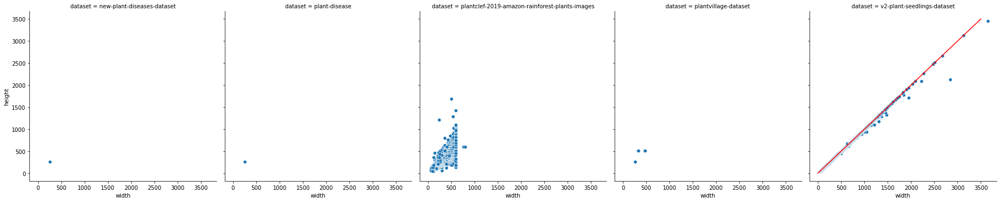

In [25]:
# Calculer la répartition des tailles d'image (hauteur par largeur en fonction du dataset et de la couleur)
df_dim = df[df.ext.isin(['JPG', 'PNG']) & ~df[['size', 'height', 'width']].isna().any(axis = 1)].groupby(['dataset', 'color', 'height', 'width'], as_index=False).agg({'file':'count'})
# Afficher la répartition des tailles d'image
import seaborn as sns
import matplotlib.pyplot as plt
sns.relplot(x='width', y='height', col='dataset', data=df_dim)
plt.plot([0,3500],[0,3500], 'r');


Quelques précisions :  
* __new-plant-diseases-dataset__ :
  - 87 900 photos en couleur de dimension 256 x 256 au format JPG
  - Toutes les photos sont uniques
* __plant-disease__ :
  - 108 610 photos en couleur de dimension 256 x 256 au format JPG
  - Toutes les photos sont en doublons (il n’y a en fait que 54305 photos)
  - 2 photos (en doublon) en couleur de dimension 256 x 256 au format PNG
* __plantvillage-dataset__ :
  - 108 610 photos en couleur de dimension 256 x 256 au format JPG :
    - 54305 photos normales
    - 54305 photos ségmentées (sur fond noir)
    - 54306 photos en noir et blanc de dimension 256 x 256 au format JPG
    - Ce sont les mêmes photos que celle de plant-disease
* __plantclef-2019-amazon-rainforest-plants-images__ :
   - La base contient 3040 photos en couleur, 59 photos en noir et blanc et 43 photos corrompues 
  - Toutes les images ne sont pas de même dimension
* __v2-plant-seedlings-dataset__ :
  - 548 photos ne peuvent être lues par OpenCV
  - Les photos ne sont pas toutes de même dimension mais elle sont majoritairement carrés

## Conclusions :  
Les images concernant les maladies (new-plant-diseases-dataset, plant-disease et plant-village-dataset) sont les plus prometteuses en terme de volume mais aussi d'organisation car elles possèdent les caractéristiques suivantes :
* Elles ont toutes la même dimension
* Elles sont déjà classées (la classe est définie par le nom du dossier les contenant)
* Elles sont déjà organisées en jeu d'entraînement, de validation et de test
* Elles sont structurées au format KERAS
* Un sous-ensemble d'images existe en couleur, en échelle de gris et en segmenté

## Deuxième exploration
### Classification
Nous poussons l'analyse un peu plus loin en nous concentrant sur les images concernant les maladies

In [59]:
df_disease = df[df['dataset'].isin(['new-plant-diseases-dataset', 'plant-disease', 'plantvillage-dataset'])]
df_disease.height = df_disease.height.astype(int)
df_disease.width = df_disease.width.astype(int)
df_disease.channel = df_disease.channel.astype(int)
# Suppression des doublons dans le jeu de données plant-disease
df_disease['doublon'] = df_disease[df_disease['dataset']=='plant-disease'].folder.apply(lambda x: True if x.split(ossep)[1]=='dataset' else False)
df_disease = df_disease.drop(df_disease[(df_disease['dataset']=='plant-disease') & (df_disease['doublon'])].index)
df_disease.drop('doublon', axis=1, inplace=True)

Nous récupérons la classe de la plante, de la maladie et du type d'échantillon grâce au nom du répertoire dans lequel se trouve l'image.

In [60]:
def get_last_segment(val, pos):
    seg = val.split(ossep)
    last_seg = seg[len(seg)-1]
    if '___' in last_seg:
        return last_seg.split('___')[pos]
    else:
        return ''

def get_sample_type(val):
    seg = val.split(ossep)
    sample_type = ['train', 'valid', 'test', 'color', 'grayscale', 'segmented']
    for st in sample_type:
        if st in seg:
            return st
    return ''
df_disease['plant'] = df_disease.folder.apply(lambda x: get_last_segment(x, 0))
df_disease['disease'] = df_disease.folder.apply(lambda x: get_last_segment(x, 1))
df_disease['sample'] = df_disease.folder.apply(lambda x: get_sample_type(x))

Nous traduisons les classes de plantes et des maladies

In [61]:
plant_translation = {   'Apple'                                 : 'Pomme',
                        'Blueberry'                             : 'Myrtille',
                        'Cherry_(including_sour)'               : 'Cerise et griotte',
                        'Corn_(maize)'                          : 'Maïs',
                        'Grape'                                 : 'Raisin',
                        'Orange'                                : 'Orange',
                        'Peach'                                 : 'Pêche',
                        'Pepper,_bell'                          : 'Poivron',
                        'Potato'                                : 'Pomme de terre',
                        'Raspberry'                             : 'Framboise',
                        'Soybean'                               : 'Soja',
                        'Squash'                                : 'Courge',
                        'Strawberry'                            : 'Fraise',
                        'Tomato'                                : 'Tomate'}

disease_translation = { 'Apple_scab'                            : 'Tavelure', 
                        'Bacterial_spot'                        : 'Bactériose',
                        'Black_rot'                             : 'Pourriture noire', 
                        'Cedar_apple_rust'                      : 'Rouille de virginie',
                        'Cercospora_leaf_spot Gray_leaf_spot'   : 'Cercosporiose', 
                        'Common_rust_'                          : 'Rouille commune', 
                        'Early_blight'                          : 'Alternariose',
                        'Esca_(Black_Measles)'                  : 'Maladie du bois', 
                        'Haunglongbing_(Citrus_greening)'       : 'Verdissement',
                        'Late_blight'                           : 'Mildiou', 
                        'Leaf_Mold'                             : 'Cladosporiose', 
                        'Leaf_blight_(Isariopsis_Leaf_Spot)'    : 'Isariopsis',
                        'Leaf_scorch'                           : 'Brulure', 
                        'Northern_Leaf_Blight'                  : 'Helminthosporiose du nord', 
                        'Powdery_mildew'                        : 'Oïdium',
                        'Septoria_leaf_spot'                    : 'Septoriose', 
                        'Spider_mites Two-spotted_spider_mite'  : 'Tétranyque',
                        'Target_Spot'                           : 'Corynesporiose', 
                        'Tomato_Yellow_Leaf_Curl_Virus'         : 'Virus des feuilles jaunes en cuillère', 
                        'Tomato_mosaic_virus'                   : 'Virus Mosaïque',
                        'healthy'                               : 'Plante saine'}

df_disease['plant_fr'] = df_disease.plant.apply(lambda x: plant_translation[x] if x != '' else '')
df_disease['disease_fr'] = df_disease.disease.apply(lambda x: disease_translation[x] if x != '' else '')
# Sauvegarde de la liste des fichiers concernant les maladies dans le fichier disease.csv pour une réutilisation ultérieure
df_disease.to_csv(racine + ossep + 'disease.csv', sep=sep, index=False)

### Distributions
__Distribution des classes de plantes :__  
* Nous calculons le nombre d'images par échantillon et par plante. 

In [62]:
plant_count = df_disease.groupby(['dataset', 'sample', 'plant_fr'], as_index=False).file.count()
# Les 33 images de l'échantillon de test du dataset new-plant-diseases-dataset n'ont pas de classe, elles sont ignorées
plant_count = pd.pivot_table(plant_count[~((plant_count['dataset']=='new-plant-diseases-dataset') & (plant_count['sample']=='test'))], index='plant_fr', columns=['dataset', 'sample'], aggfunc='sum').reset_index()

* Nous affichons la distribution dans 3 graphiques (un par jeu de données)

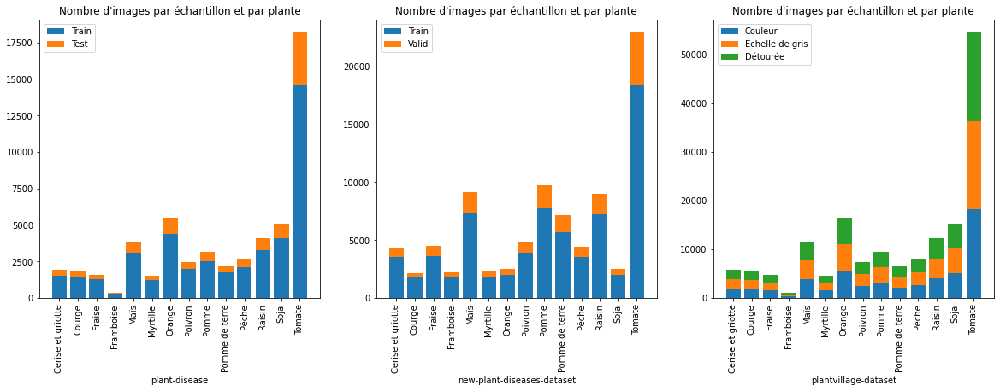

In [63]:
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(20, 6))
ax1 = fig.add_subplot(131)
ax1.bar(range(len(plant_count)), plant_count[('file', 'plant-disease','train')], label='Train')
ax1.bar(range(len(plant_count)), plant_count[('file', 'plant-disease','test')], bottom = plant_count[('file', 'plant-disease','train')], label='Test')
ax1.set_xticks(plant_count.index)
ax1.set_xticklabels(plant_count.plant_fr.values, rotation=90)
ax1.set_xlabel('plant-disease')
ax1.set_title("Nombre d'images par échantillon et par plante")
ax1.legend()

ax2 = fig.add_subplot(132)
ax2.bar(range(len(plant_count)), plant_count[('file', 'new-plant-diseases-dataset','train')], label='Train')
ax2.bar(range(len(plant_count)), plant_count[('file', 'new-plant-diseases-dataset','valid')], bottom = plant_count[('file', 'new-plant-diseases-dataset','train')], label='Valid')
ax2.set_xticks(plant_count.index)
ax2.set_xticklabels(plant_count.plant_fr.values, rotation=90)
ax2.set_xlabel('new-plant-diseases-dataset')
ax2.set_title("Nombre d'images par échantillon et par plante")
ax2.legend()

ax3 = fig.add_subplot(133)
ax3.bar(range(len(plant_count)), plant_count[('file', 'plantvillage-dataset','color')], label='Couleur')
ax3.bar(range(len(plant_count)), plant_count[('file', 'plantvillage-dataset','grayscale')], bottom = plant_count[('file', 'plantvillage-dataset','color')], label='Echelle de gris')
ax3.bar(range(len(plant_count)), plant_count[('file', 'plantvillage-dataset','segmented')], bottom = plant_count[('file', 'plantvillage-dataset','color')] + plant_count[('file', 'plantvillage-dataset','grayscale')], label='Détourée')
ax3.set_xticks(plant_count.index)
ax3.set_xticklabels(plant_count.plant_fr.values, rotation=90)
ax3.set_xlabel('plantvillage-dataset')
ax3.set_title("Nombre d'images par échantillon et par plante")
ax3.legend()
plt.show();

__Distribution des classes de maladies :__  
* Nous calculons le nombre d'images par échantillon et par maladie.

In [64]:
disease_count = df_disease.groupby(['dataset', 'sample', 'disease_fr'], as_index=False).file.count()
# Les 33 images de l'échantillon de test du dataset new-plant-diseases-dataset n'ont pas de classe, elles sont ignorées
disease_count = pd.pivot_table(disease_count[~((disease_count['dataset']=='new-plant-diseases-dataset') & (disease_count['sample']=='test'))], index='disease_fr', columns=['dataset', 'sample'], aggfunc='sum').reset_index()

* Nous affichons la distribution dans 3 graphiques (un par jeu de données)

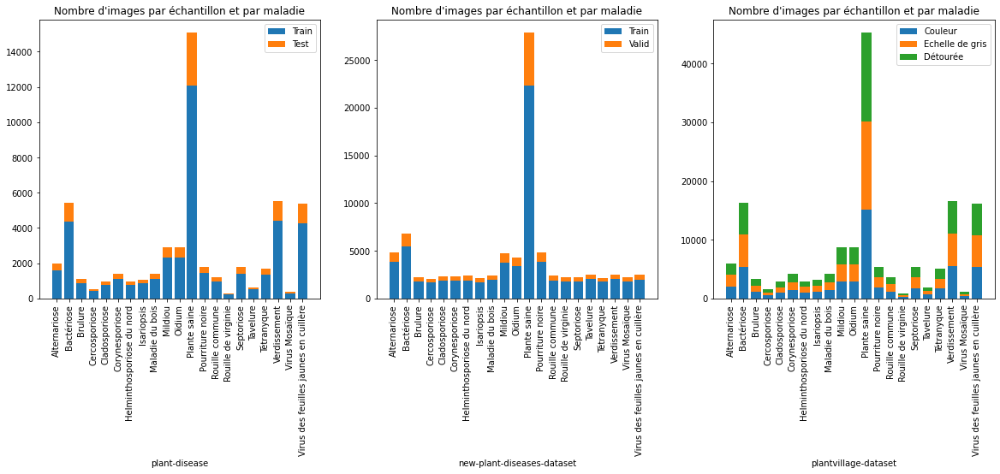

In [65]:
fig = plt.figure(figsize=(20, 6))
ax1 = fig.add_subplot(131)
ax1.bar(range(len(disease_count)), disease_count[('file', 'plant-disease','train')], label='Train')
ax1.bar(range(len(disease_count)), disease_count[('file', 'plant-disease','test')], bottom = disease_count[('file', 'plant-disease','train')], label='Test')
ax1.set_xticks(disease_count.index)
ax1.set_xticklabels(disease_count.disease_fr.values, rotation=90)
ax1.set_xlabel('plant-disease')
ax1.set_title("Nombre d'images par échantillon et par maladie")
ax1.legend()

ax2 = fig.add_subplot(132)
ax2.bar(range(len(disease_count)), disease_count[('file', 'new-plant-diseases-dataset','train')], label='Train')
ax2.bar(range(len(disease_count)), disease_count[('file', 'new-plant-diseases-dataset','valid')], bottom = disease_count[('file', 'new-plant-diseases-dataset','train')], label='Valid')
ax2.set_xticks(disease_count.index)
ax2.set_xticklabels(disease_count.disease_fr.values, rotation=90)
ax2.set_xlabel('new-plant-diseases-dataset')
ax2.set_title("Nombre d'images par échantillon et par maladie")
ax2.legend()

ax3 = fig.add_subplot(133)
ax3.bar(range(len(disease_count)), disease_count[('file', 'plantvillage-dataset','color')], label='Couleur')
ax3.bar(range(len(disease_count)), disease_count[('file', 'plantvillage-dataset','grayscale')], bottom = disease_count[('file', 'plantvillage-dataset','color')], label='Echelle de gris')
ax3.bar(range(len(disease_count)), disease_count[('file', 'plantvillage-dataset','segmented')], bottom = disease_count[('file', 'plantvillage-dataset','color')] + disease_count[('file', 'plantvillage-dataset','grayscale')], label='Détourée')
ax3.set_xticks(disease_count.index)
ax3.set_xticklabels(disease_count.disease_fr.values, rotation=90)
ax3.set_xlabel('plantvillage-dataset')
ax3.set_title("Nombre d'images par échantillon et par maladie")
ax3.legend()
plt.show();

### Distribution des classes par plantes et par maladies :

* Nous calculons le nombre d'images par échantillon, par plante et par maladie pour le jeu de données new-plant-diseases-dataset

In [66]:
plant_disease_count = df_disease[df_disease['dataset']=='new-plant-diseases-dataset'].groupby(['sample', 'plant_fr', 'disease_fr'], as_index=False).file.count()
# Les 33 images de l'échantillon de test du dataset new-plant-diseases-dataset n'ont pas de classe, elles sont ignorées
plant_disease_count = pd.pivot_table(plant_disease_count[~(plant_disease_count['sample']=='test')], index=['plant_fr', 'disease_fr'], columns=['sample'], aggfunc='sum').reset_index()
plant_disease_count['total'] = plant_disease_count[('file', 'train')] + plant_disease_count[('file', 'valid')]
plant_disease_count['order'] = plant_disease_count.disease_fr.apply(lambda x: 0 if x == 'Plante saine' else 1)
plant_disease_count.sort_values(by=['plant_fr', 'order', 'disease_fr'], inplace=True)
plant_disease_count.reset_index(inplace=True)
plant_disease_count.drop('index', axis=1, inplace=True)

* Nous affichons la distribution dans un graphique :  
  * Les maladies (en abscisse) sont regroupées par plante (en commentaire).
  * La distribution de la plante saine est toujours affichée en premier (lorsqu'elle existe)
  * Les groupes de maladie sont espacés pour une meilleure lisibilité

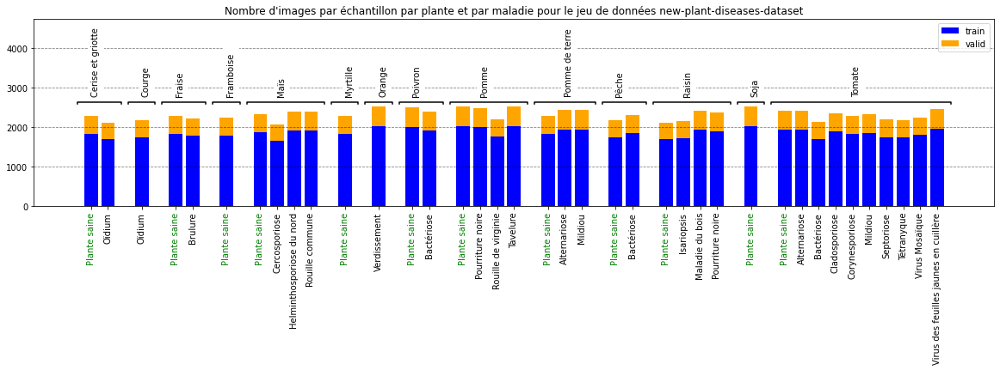

In [67]:
fig = plt.figure(figsize=(20, 4))
# On augmente artificiellement la dimension des ordonnées pour laisser de la place pour les noms des plantes
ymax = plant_disease_count.total.max() + 2200
plt.ylim([0, ymax])
# On initialise les variables utilisées par la suite
previous = plant_disease_count.iloc[0, 0] # On mémorise la plante précédente dans l'ordre d'apparition dans le dataset
pos = 0 # On mémorise la position de l'étiquette d'abscisse à traiter
start = -1 # On mémorise l'abscisse de démarrage de la première accolade
yline = plant_disease_count.total.max() + 100 # On mémorise l'ordonnée des accolades
xoffset = 0.2 # On gère un décroché sur l'axe des abscisses pour l'accolade
yoffset = 50 # On gère un décroché sur l'axe des ordonnées pour l'accolade
Xtick = [] # On initialise la liste permettant de gérer la position des étiquettes en abscisse
Xlabel = [] # On initialise la liste permettant de gérer le libellé des étiquettes en abscisse
XSpecial = [] # On initialise la liste permettant de gérer la position des étiquettes spéciales en abscisse (plante saine)
label1 = '' # On initialise la légende de la barre des données d'entrainement
label2 = '' # On initialise la légende de la barre des données de validation
# Principe : on parcourt le dataset, lorsqu'on change de plante : 
#   - On crée un espace entre groupe 
#   - On affiche une accolade au dessus des barres avec le nom de la plante
for i in range(len(plant_disease_count)):
    plant, disease, train, valid, total, order = plant_disease_count.iloc[i, :]
    if plant != previous: # Détection d'un changement de plante
        # Création de l'accolade
        plt.plot([start + xoffset, start + xoffset, pos - xoffset, pos - xoffset], [yline - yoffset, yline, yline, yline - yoffset], color='black')
        # Affichage du nom de la plante
        plt.text(start + (pos-start)//2, yline + 200, previous, rotation=90, backgroundcolor='white')
        previous = plant
        start = pos
        pos+=1
    # Gestion des étiquettes en abscisse
    Xtick.append(pos) # On mémorise la position de l'étiquette
    Xlabel.append(disease) # On mémorise le libellé de l'étiquette
    if order == 0:
        XSpecial.append(i) # On mémorise les étiquettes 'Plante saine'
    # Pour la dernière maladie, on affiche une légende
    if i == len(plant_disease_count)-1:
        label1 = 'train'
        label2 = 'valid'
    plt.bar([pos],[train], color=['blue'], label=label1)
    plt.bar([pos],[valid], bottom=[train], color=['orange'], label=label2)
    pos +=1
# Gestion de la dernière accolade
plt.plot([start + xoffset, start + xoffset, pos - xoffset, pos - xoffset], [yline - yoffset, yline, yline, yline - yoffset],color='black')
plt.text(start + (pos-start)//2, yline + 200, previous, rotation=90, backgroundcolor='white')
# Gestion de l'affichage des étiquettes en abscisse
plt.xticks(Xtick, Xlabel, rotation=90)
for i in XSpecial:
    plt.gca().get_xticklabels()[i].set_color("green")
plt.legend()
plt.grid(True, linestyle = '--', axis='y', color='black', alpha=0.5)
plt.title("Nombre d'images par échantillon par plante et par maladie pour le jeu de données new-plant-diseases-dataset");

### Sélection
Le jeu de données __new-plant-diseases-dataset__ est prometteur aussi bien en volume qu'en organisation.  
Affichons quelques images aléatoirement dans l'échantillon d'entraînement.

In [68]:
# Préparation du jeu de données dans lequel nous allons tirer une photo aléatoirement pour chaque classe
img_random = df_disease[(df_disease['dataset']=='new-plant-diseases-dataset') & (df_disease['sample']=='train')].copy()
img_random['malade'] = img_random.disease_fr.apply(lambda x: 0 if x=='Plante saine' else 1)
img_random.sort_values(by=['plant_fr', 'malade', 'disease_fr'], ascending=True, inplace=True)
img_random.reset_index(inplace = True)
img_random.drop('index', axis=1, inplace=True)

In [69]:
# Préparation de la grille d'affichage des images sélectionnées aléatoirement
# Les plantes sont présentées en ligne par ordre alphabétique
# La première colonne présente toujours une plante saine, les autres colonnes présentent les maladies
# La grille contient 5 colonnes et 15 lignes (1 ligne par plante et 2 lignes pour la tomate qui a plus de 5 classes de maladie)
import numpy as np
plant_list = img_random.plant_fr.unique()
img_grid = np.zeros((len(plant_list)+1, 5), np.int)
for row, plant in enumerate(plant_list):
    disease_list = img_random[img_random['plant_fr']==plant].disease_fr.unique()
    offset = not('Plante saine' in disease_list)
    for col, disease in enumerate(disease_list):
        colnum = col + offset
        rownum = row
        if colnum >= 5: # Pour les tomates, il y a plus de 5 classes de maladie
            colnum -= 5
            rownum = row + 1
        img_grid[rownum, colnum] = np.random.choice(img_random[(img_random['plant_fr']==plant) & (img_random['disease_fr']==disease)].index)

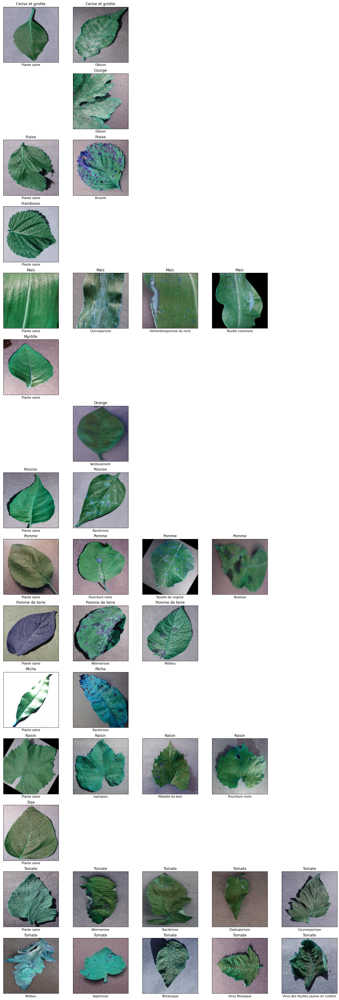

In [73]:
# Affichage de la grille d'images aléatoires
import cv2
fig = plt.figure(figsize=(20, 60))
maxrow = img_grid.shape[0]
maxcol = img_grid.shape[1]
for posx, row in enumerate(img_grid):
    for posy, item in enumerate(row):
        if item !=0:
            pos = posx * maxcol + posy + 1
            ax = fig.add_subplot(maxrow, maxcol, pos)
            ax.set_xticks([])
            ax.set_yticks([])
            ax.set_xlabel(img_random.iloc[item, 13])
            ax.set_title(img_random.iloc[item, 12])
            fname = racine + ossep + img_random.iloc[item, 0] + ossep + img_random.iloc[item, 1] + ossep + img_random.iloc[item, 2]
            if os.name == 'nt': # Pour tenir compte de la limite de 260 caractères dans le nom d'un fichier imposée par Windows
                fname = "\\\\?\\" + fname
            img = cv2.imread(fname, cv2.IMREAD_UNCHANGED)
            ax.imshow(img)


### Images moyennes
Prenons toutes les images des échantillons d'entraînement et de validation des différentes classes (plante et maladie) et réalisons des images moyennes.  
Compte tenu du nombre d'images à traiter, nous utiliserons le multi-threading pour calculer et afficher les images moyennes.

In [74]:
import threading
Lock = threading.RLock()

# Création de la classe dérivée de Thread traitant des lots d'images (par type d'échantillon, par plante et par maladie)
class DisplayImageMean(threading.Thread):
    def __init__(self, df, plant, disease, sample, fig, pos):
        threading.Thread.__init__(self)
        self.df = df
        self.plant = plant
        self.disease = disease
        self.sample = sample
        self.fig = fig
        self.pos = pos
    # Calcul de l'image moyenne pour un lot (pour un échantillon, une plante et une maladie)
    def get_image_mean(self):
        lot = self.df[(self.df['sample']==self.sample) & (self.df['plant_fr']==self.plant) & (self.df['disease_fr']==self.disease)]
        img_mean = np.zeros((256, 256, 3), np.int)
        fileNames = (lot.iloc[:, 0] + ossep + lot.iloc[:, 1] + ossep + lot.iloc[:, 2]).values
        for f in fileNames:
            f = racine + ossep + f
            if os.name == 'nt': # Pour tenir compte de la limite de 260 caractères dans le nom d'un fichier imposée par Windows
                f = "\\\\?\\" + f
            img = cv2.imread(f)
            img_mean += img
        img_mean //= len(fileNames)
        return img_mean
    # Affichage de l'image moyenne d'un lot
    def format_image_mean(self, img):
        ax = self.fig.add_subplot(10, 8, self.pos)
        ax.set_xticks([])
        ax.set_yticks([])
        ax.set_xlabel(self.disease)
        ax.set_ylabel(self.sample)
        ax.set_title(self.plant)
        ax.imshow(img)

    def run(self):
        image = self.get_image_mean()
        with Lock:
            self.format_image_mean(image)

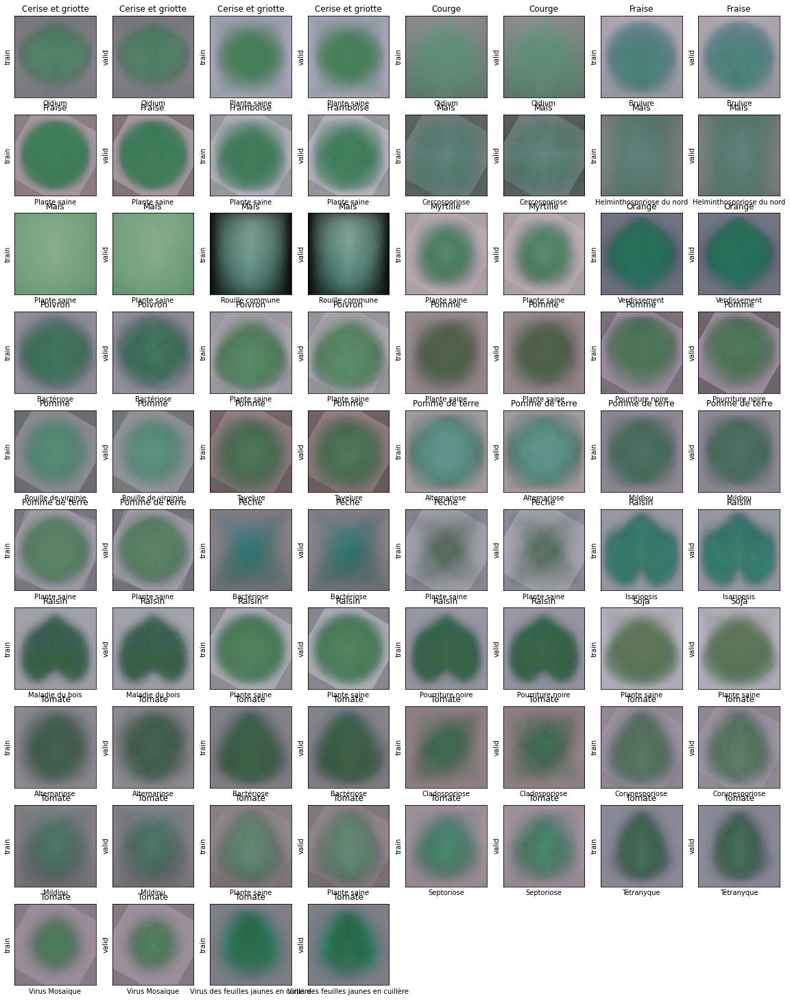

Wall time: 7min 11s


In [75]:
%%time
import matplotlib.pyplot as plt
import numpy as np
import cv2
# Préparation des lots d'image
case_list = df_disease[(df_disease['dataset']=='new-plant-diseases-dataset') & (df_disease['sample']!='test')].groupby(['plant_fr', 'disease_fr', 'sample']).file.count().reset_index()
fig = plt.figure(figsize=(20, 26))
threads = []
# Lancement des threads sur chaque lot
for i in range(len(case_list)):
    plant, disease, sample = case_list.iloc[i, :-1]
    DIM = DisplayImageMean(df_disease, plant, disease, sample, fig, i+1)
    threads.append(DIM)
    DIM.start()
for t in threads:
    t.join()
plt.show(); # 5 minutes et 16 secondes (contre plus de 24 minutes en traitement séquentiel)

Les images moyennes présentent des similitudes :
* un halo verdatre centré (sauf pour les plantes saines de maïs)
* les contours du halo sont plus sombres
* le fond est gris 
* certaines images semblent avoir subi une rotation d'une vingtaine de degrés